# ATHENA CAMM Hackathon 01
## Boundary Detection + Atom Finding

**September 2026**

A scientific algorithm should not only work once. It should be **explainable, testable, fast, consistent, and robust**.

### Challenge 1 — Boundary Detection
- Dataset: **SiSb**
- Input: **12 HAADF-STEM images**
- Goal: detect the crystalline–amorphous boundary

### Challenge 2 — Atom Finding
- Dataset: **YBCO**
- Input: atomic-resolution STEM images
- Goal: return atomic-column coordinates

All helper functions are kept in:

```text
utils.py
```

The notebook stays focused on the two functions you are asked to improve.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kbarakati/athena_camm_hackathon/blob/k4my4r/docs/day_16_11092026/boundary_detection.ipynb)

## 1. Setup

In [1]:
%pip install -q pyTEMlib ipympl

Note: you may need to restart the kernel to use updated packages.


In [2]:
# # Download only the files needed for this challenge
# !git clone -q --filter=blob:none --no-checkout -b k4my4r \
#     https://github.com/kbarakati/athena_camm_hackathon.git athena

# %cd athena
# !git sparse-checkout init --cone
# !git sparse-checkout set docs/day_16_11092026
# !git checkout -q

# %cd docs/day_16_11092026


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage

from utils import (
    resolve_data_dir,
    list_emd_files,
    robust_normalize,
    load_haadf,
    show_image_grid,
    plot_ground_truth_grid,
    plot_boundary_result,
    evaluate_against_ground_truth,
    summarize_accuracy,
    evaluate_robustness,
    summarize_robustness,
    evaluate_speed,
    summarize_speed,
    plot_atom_result,
    validate_atom_output,
    atom_repeatability,
    atom_noise_robustness,
    atom_photometric_robustness,
)

In [4]:
DATA_DIR = resolve_data_dir()

SISB_DIR = DATA_DIR / "SiSb"
YBCO_DIR = DATA_DIR / "YBCO"
GT_DIR = DATA_DIR / "SiSb_ground_truth"

print("DATA_DIR:", DATA_DIR)
print("SiSb:", SISB_DIR.exists())
print("YBCO:", YBCO_DIR.exists())
print("SiSb ground truth:", GT_DIR.exists())

DATA_DIR: /Users/spuplampu/camm_hackathon/day_16/data
SiSb: True
YBCO: True
SiSb ground truth: True


# Challenge 1 — Boundary Detection

## Goal

Write:

```python
boundary = detect_boundary(image)
```

The function must return a **2D boolean array with the same shape as the input image**.

`True` means that pixel belongs to the predicted crystalline–amorphous boundary.

## 2. Load the SiSb challenge images

In [5]:
all_sisb_files = list_emd_files(SISB_DIR)

N_SISB = 12
sisb_files = all_sisb_files[:N_SISB]

sisb_images = [
    load_haadf(file)
    for file in sisb_files
]

sisb_titles = [
    file.stem.split("-")[0].strip()
    for file in sisb_files
]

print(f"Using {len(sisb_files)} SiSb images")

Using 12 SiSb images


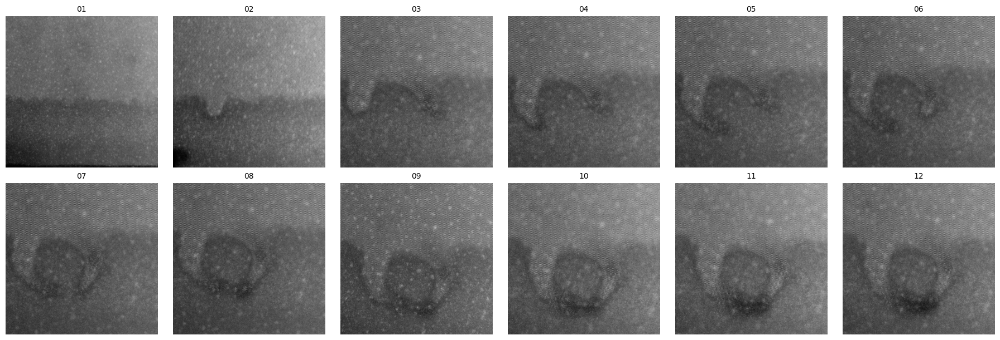

In [6]:
show_image_grid(
    sisb_images,
    titles=sisb_titles,
    rows=2,
)

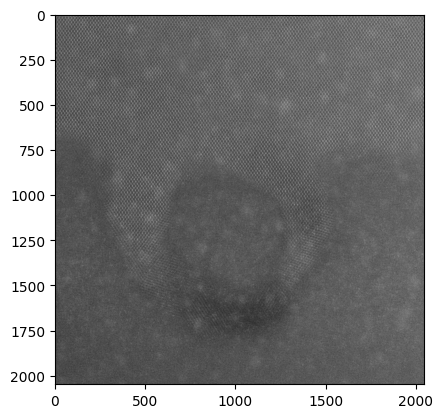

In [7]:
plt.imshow(sisb_images[11], cmap="gray")

### Human ground truth

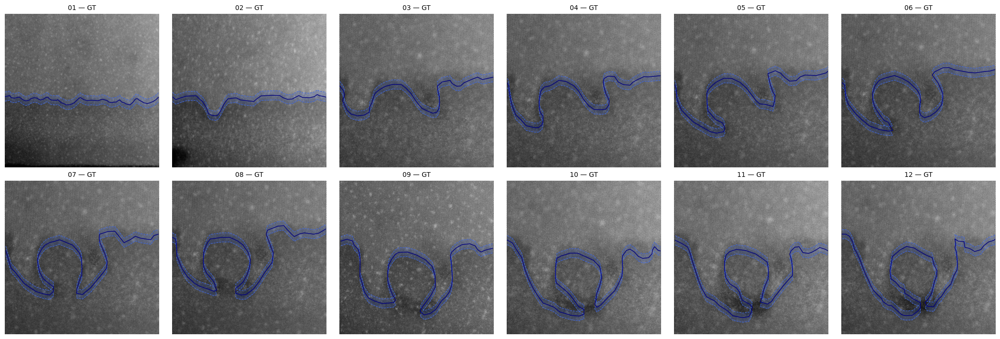

In [8]:
plot_ground_truth_grid(
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    rows=2,
)

## 3. Build your boundary detector

A simple texture-based baseline is provided.

You may completely replace the code between the two markers.  
Do **not** change the function name, input, or required output format.

In [9]:
def detect_boundary(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # 1. Normalize
    x = robust_normalize(image)

    # 2. Estimate local texture using local variance
    sigma_texture = 7

    local_mean = ndimage.gaussian_filter(
        x,
        sigma=sigma_texture
    )

    local_mean_squared = ndimage.gaussian_filter(
        x**2,
        sigma=sigma_texture
    )

    local_variance = np.maximum(
        local_mean_squared - local_mean**2,
        0
    )

    # 3. Smooth the texture map
    texture = ndimage.gaussian_filter(
        local_variance,
        sigma=1
    )

    # 4. Separate the two texture regimes
    threshold = np.median(texture)
    phase_mask = texture > threshold

    # 5. Clean the phase segmentation
    phase_mask = ndimage.binary_opening(
        phase_mask,
        iterations=2
    )

    phase_mask = ndimage.binary_closing(
        phase_mask,
        iterations=1
    )

    # 6. Extract the interface
    dilated = ndimage.binary_dilation(
        phase_mask,
        iterations=1
    )

    eroded = ndimage.binary_erosion(
        phase_mask,
        iterations=1
    )

    boundary = dilated ^ eroded



    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return boundary.astype(bool)

In [10]:
import numpy as np
from scipy.ndimage import (
gaussian_filter,
binary_opening,
binary_closing,
binary_erosion,
binary_fill_holes,
label,
)
from scipy.ndimage import binary_propagation

# ========================================================
# Gaussian-based approach to detect the boundary between
# crystalline and amorphous regions in HAADF-STEM images.
# ========================================================



def detect_boundary(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    image = np.asarray(image, dtype=np.float32)

    # ------------------------------------------------------------
    # 1. Robust intensity normalization
    # ------------------------------------------------------------
    low = np.percentile(image, 1)
    high = np.percentile(image, 99)

    image_norm = (image - low) / (high - low + 1e-12)

    image_norm = np.clip(image_norm, 0, 1)

    # ------------------------------------------------------------
    # 2. Remove slowly varying illumination/background
    #
    # This helps make the detector insensitive to:
    #   - brightness changes
    #   - inclined intensity backgrounds
    #   - broad illumination gradients
    # ------------------------------------------------------------
    background = gaussian_filter(image_norm, sigma=8)

    high_pass = image_norm - background

    # ------------------------------------------------------------
    # 3. Mildly suppress pixel-scale noise
    # ------------------------------------------------------------
    filtered = gaussian_filter(high_pass, sigma=0.8)

    # ------------------------------------------------------------
    # 4. Difference-of-Gaussians
    #
    # Atomic periodicity should produce stronger responses in the
    # crystalline region than in the amorphous region.
    # ------------------------------------------------------------
    fine = gaussian_filter(filtered, sigma=1.0)
    coarse = gaussian_filter(filtered, sigma=2.5)

    dog = fine - coarse

    # ------------------------------------------------------------
    # 5. Local texture energy
    #
    # Squaring removes the sign of the DoG response.
    # Spatial averaging measures how much structured texture exists
    # locally.
    # ------------------------------------------------------------
    energy = gaussian_filter(dog**2, sigma=3.0)

    # ------------------------------------------------------------
    # 6. Automatic Otsu threshold
    # ------------------------------------------------------------
    hist, bin_edges = np.histogram(
        energy.ravel(),
        bins=256
    )

    hist = hist.astype(np.float64)

    probability = hist / hist.sum()

    bin_centers = (
        bin_edges[:-1] + bin_edges[1:]
    ) / 2

    omega = np.cumsum(probability)
    mu = np.cumsum(probability * bin_centers)

    mu_total = mu[-1]

    between_variance = (
        (mu_total * omega - mu) ** 2
        /
        (omega * (1.0 - omega) + 1e-12)
    )

    threshold = bin_centers[
        np.argmax(between_variance)
    ]


    # crystalline = energy > threshold

    # ------------------------------------------------------------
    # Generous crystalline classification using hysteresis
    # ------------------------------------------------------------

    high_threshold = threshold
    low_threshold = 0.45 * threshold

    # Very confident crystalline pixels
    strong_crystalline = energy > high_threshold

    # Includes weaker/distorted crystalline texture
    possible_crystalline = energy > low_threshold

    # Keep weaker texture only when connected to strong crystal
    crystalline = binary_propagation(
        strong_crystalline,
        mask=possible_crystalline
    )

    # ------------------------------------------------------------
    # 7. Morphological cleanup
    # ------------------------------------------------------------
    crystalline = binary_opening(
        crystalline,
        iterations=1
    )

    crystalline = binary_closing(
        crystalline,
        iterations=2
    )


    # ------------------------------------------------------------
    # 7. Clean crystalline mask
    # ------------------------------------------------------------

    # Minimum connected-region size to retain.
    # Increase this if isolated loops are still present.
    min_region_size = 2000

    # Label all connected crystalline regions.
    labeled_mask, num_features = label(crystalline)

    # Count pixels in each connected region.
    region_sizes = np.bincount(labeled_mask.ravel())

    # Label 0 is the background, so do not keep it.
    keep_regions = region_sizes >= min_region_size
    keep_regions[0] = False

    # Remove small isolated crystalline regions.
    crystalline = keep_regions[labeled_mask]


    # ------------------------------------------------------------
    # 8. Fill enclosed holes
    #
    # Small amorphous islands inside the crystalline region create
    # closed boundary loops. Filling them removes those loops.
    # ------------------------------------------------------------

    crystalline = binary_fill_holes(crystalline)


    # ------------------------------------------------------------
    # 9. Smooth the crystalline/amorphous interface
    #
    # Gaussian smoothing is applied to the binary mask rather than
    # directly to the boundary. Thresholding it back to Boolean
    # produces a smoother continuous interface.
    # ------------------------------------------------------------

    boundary_smoothing_sigma = 1.5

    smooth_mask = gaussian_filter(
        crystalline.astype(np.float32),
        sigma=boundary_smoothing_sigma
    )

    crystalline = smooth_mask > 0.5

    # ------------------------------------------------------------
    # 8. Convert segmented region into boundary
    # ------------------------------------------------------------
    interior = binary_erosion(crystalline)

    boundary = crystalline ^ interior

    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return boundary.astype(bool)

In [11]:
import numpy as np

from scipy.ndimage import (
    gaussian_filter,
    zoom,
    binary_erosion,
    binary_fill_holes,
    label,
)


# ========================================================
# FFT based approach to detect the boundary between 
# crystalline and amorphous regions in HAADF-STEM images.
# ========================================================

def detect_boundary_C(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # ------------------------------------------------------------
    # USER-TUNABLE PARAMETERS
    # ------------------------------------------------------------

    # Size of each local Fourier-analysis window.
    #
    # Larger:
    #   - better frequency resolution
    #   - more robust periodicity measurement
    #   - poorer spatial localization of the boundary
    #
    # Smaller:
    #   - better boundary localization
    #   - noisier Fourier spectrum
    patch_size = 32

    # Distance between neighboring Fourier-analysis patches.
    #
    # Smaller stride:
    #   - smoother / higher-resolution periodicity map
    #   - slower
    #
    # Larger stride:
    #   - faster
    #   - coarser map
    stride = 6

    # Frequency range to examine.
    #
    # Frequencies are in cycles / pixel.
    #
    # min_frequency removes:
    #   - DC intensity
    #   - slow illumination gradients
    #
    # max_frequency removes frequencies very close to Nyquist,
    # which are often dominated by noise.
    min_frequency = 0.04
    max_frequency = 0.45

    # Number of strongest Fourier components used when determining
    # whether the spectrum contains concentrated peaks.
    number_of_peaks = 8

    # Spatial smoothing of the resulting periodicity map.
    periodicity_smoothing_sigma = 1.5

    # Make the classification slightly more generous.
    #
    # 1.00 = use Otsu threshold directly
    # 0.80 = moderately generous
    # 0.70 = more generous
    threshold_factor = 0.650

    # Remove isolated crystalline regions smaller than this.
    minimum_region_size = 1000

    # Smooth final crystalline/amorphous segmentation.
    boundary_smoothing_sigma = 1.0


    # ------------------------------------------------------------
    # 1. Convert image to floating point
    # ------------------------------------------------------------

    image = np.asarray(image, dtype=np.float32)

    height, width = image.shape


    # ------------------------------------------------------------
    # 2. Robust global intensity normalization
    #
    # Fourier periodicity itself does not strongly depend on
    # brightness, but normalization improves numerical stability
    # across different images.
    # ------------------------------------------------------------

    low = np.percentile(image, 1)
    high = np.percentile(image, 99)

    image_norm = (image - low) / (high - low + 1e-12)

    image_norm = np.clip(
        image_norm,
        0.0,
        1.0
    )


    # ------------------------------------------------------------
    # 3. Adapt patch size if image is unusually small
    # ------------------------------------------------------------

    patch_size_actual = min(
        patch_size,
        height,
        width
    )

    # Keep patch reasonably large for Fourier analysis.
    patch_size_actual = max(
        patch_size_actual,
        8
    )

    half_patch = patch_size_actual // 2


    # ------------------------------------------------------------
    # 4. Pad image
    #
    # Reflection padding allows Fourier patches to be calculated
    # near the edges of the image.
    # ------------------------------------------------------------

    padded = np.pad(
        image_norm,
        half_patch,
        mode="reflect"
    )


    # ------------------------------------------------------------
    # 5. Construct Hann window
    #
    # FFT assumes the edges of a patch connect periodically.
    # A Hann window suppresses artificial Fourier peaks caused
    # by abrupt patch boundaries.
    # ------------------------------------------------------------

    hann_y = np.hanning(patch_size_actual)
    hann_x = np.hanning(patch_size_actual)

    hann_window = np.outer(
        hann_y,
        hann_x
    ).astype(np.float32)


    # ------------------------------------------------------------
    # 6. Construct Fourier-frequency mask
    #
    # Ignore:
    #   - very low frequencies
    #   - extremely high frequencies
    # ------------------------------------------------------------

    fy = np.fft.fftshift(
        np.fft.fftfreq(patch_size_actual)
    )

    fx = np.fft.fftshift(
        np.fft.fftfreq(patch_size_actual)
    )

    FX, FY = np.meshgrid(
        fx,
        fy
    )

    radial_frequency = np.sqrt(
        FX**2 + FY**2
    )

    frequency_mask = (
        (radial_frequency >= min_frequency)
        &
        (radial_frequency <= max_frequency)
    )


    # ------------------------------------------------------------
    # 7. Locations where local Fourier spectra will be evaluated
    # ------------------------------------------------------------

    y_positions = np.arange(
        0,
        height,
        stride
    )

    x_positions = np.arange(
        0,
        width,
        stride
    )

    periodicity_coarse = np.zeros(
        (
            len(y_positions),
            len(x_positions)
        ),
        dtype=np.float32
    )


    # ------------------------------------------------------------
    # 8. Calculate local Fourier periodicity
    # ------------------------------------------------------------

    for iy, y in enumerate(y_positions):

        for ix, x in enumerate(x_positions):

            # ----------------------------------------------------
            # Extract local STEM patch
            # ----------------------------------------------------

            patch = padded[
                y:y + patch_size_actual,
                x:x + patch_size_actual
            ].astype(np.float32)


            # ----------------------------------------------------
            # Remove local mean
            #
            # This removes sensitivity to local brightness and
            # slowly varying image backgrounds.
            # ----------------------------------------------------

            patch = patch - np.mean(patch)


            # ----------------------------------------------------
            # Normalize local contrast
            #
            # This makes Fourier classification less sensitive
            # to global or local contrast changes.
            # ----------------------------------------------------

            patch_std = np.std(patch)

            if patch_std < 1e-8:

                periodicity_coarse[iy, ix] = 0.0

                continue

            patch = patch / patch_std


            # ----------------------------------------------------
            # Apply Hann window
            # ----------------------------------------------------

            patch_windowed = (
                patch * hann_window
            )


            # ----------------------------------------------------
            # Calculate 2D Fourier transform
            # ----------------------------------------------------

            fft_patch = np.fft.fftshift(
                np.fft.fft2(
                    patch_windowed
                )
            )


            # ----------------------------------------------------
            # Fourier power spectrum
            # ----------------------------------------------------

            power = np.abs(
                fft_patch
            ) ** 2


            # ----------------------------------------------------
            # Keep desired frequency range
            # ----------------------------------------------------

            spectral_values = power[
                frequency_mask
            ]

            if spectral_values.size == 0:

                continue


            # ----------------------------------------------------
            # Normalize Fourier energy
            # ----------------------------------------------------

            total_power = np.sum(
                spectral_values
            )

            if total_power <= 1e-12:

                continue

            normalized_power = (
                spectral_values
                /
                total_power
            )


            # ----------------------------------------------------
            # FEATURE 1:
            # Fourier peak concentration
            #
            # Crystalline material should have substantial energy
            # concentrated into a small number of reciprocal-
            # lattice peaks.
            # ----------------------------------------------------

            k = min(
                number_of_peaks,
                normalized_power.size
            )

            strongest = np.partition(
                normalized_power,
                -k
            )[-k:]

            peak_fraction = np.sum(
                strongest
            )


            # ----------------------------------------------------
            # FEATURE 2:
            # Spectral entropy
            #
            # Diffuse spectrum:
            #       high entropy
            #
            # Concentrated crystalline peaks:
            #       low entropy
            # ----------------------------------------------------

            p = normalized_power + 1e-12

            entropy = -np.sum(
                p * np.log(p)
            )

            maximum_entropy = np.log(
                p.size
            )

            normalized_entropy = (
                entropy
                /
                maximum_entropy
            )


            # Periodicity increases as entropy decreases.
            entropy_periodicity = (
                1.0
                -
                normalized_entropy
            )


            # ----------------------------------------------------
            # Combine both periodicity measurements
            # ----------------------------------------------------

            periodicity_score = (
                0.5 * peak_fraction
                +
                0.5 * entropy_periodicity
            )

            periodicity_coarse[
                iy,
                ix
            ] = periodicity_score


    # ------------------------------------------------------------
    # 9. Resize coarse periodicity map to original image size
    # ------------------------------------------------------------

    zoom_y = (
        height
        /
        periodicity_coarse.shape[0]
    )

    zoom_x = (
        width
        /
        periodicity_coarse.shape[1]
    )

    periodicity_map = zoom(
        periodicity_coarse,
        (
            zoom_y,
            zoom_x
        ),
        order=1
    )


    # Ensure exact original image dimensions.
    periodicity_map = periodicity_map[
        :height,
        :width
    ]


    # ------------------------------------------------------------
    # 10. Smooth periodicity map
    # ------------------------------------------------------------

    periodicity_map = gaussian_filter(
        periodicity_map,
        sigma=periodicity_smoothing_sigma
    )


    # ------------------------------------------------------------
    # 11. Otsu threshold
    #
    # Implemented here directly so Detector C does not require
    # scikit-image.
    # ------------------------------------------------------------

    values = periodicity_map.ravel()

    hist, bin_edges = np.histogram(
        values,
        bins=256
    )

    hist = hist.astype(
        np.float64
    )

    probability = (
        hist
        /
        np.sum(hist)
    )

    bin_centers = (
        bin_edges[:-1]
        +
        bin_edges[1:]
    ) / 2.0

    omega = np.cumsum(
        probability
    )

    mu = np.cumsum(
        probability
        *
        bin_centers
    )

    mu_total = mu[-1]

    between_class_variance = (
        (
            mu_total * omega
            -
            mu
        ) ** 2
        /
        (
            omega
            *
            (1.0 - omega)
            +
            1e-12
        )
    )

    threshold = bin_centers[
        np.argmax(
            between_class_variance
        )
    ]


    # ------------------------------------------------------------
    # 12. Classify crystalline region
    #
    # High Fourier periodicity = crystalline.
    # ------------------------------------------------------------

    threshold = (
        threshold_factor
        *
        threshold
    )

    crystalline = (
        periodicity_map
        >
        threshold
    )


    # ------------------------------------------------------------
    # 13. Remove small isolated crystalline regions
    #
    # These regions would otherwise create isolated boundary loops.
    # ------------------------------------------------------------

    labeled_mask, number_regions = label(
        crystalline
    )

    region_sizes = np.bincount(
        labeled_mask.ravel()
    )

    keep_regions = (
        region_sizes
        >=
        minimum_region_size
    )

    keep_regions[0] = False

    crystalline = keep_regions[
        labeled_mask
    ]


    # ------------------------------------------------------------
    # 14. Fill enclosed holes
    #
    # Prevent isolated amorphous islands inside the crystal from
    # creating artificial closed boundaries.
    # ------------------------------------------------------------

    crystalline = binary_fill_holes(
        crystalline
    )


    # ------------------------------------------------------------
    # 15. Smooth final segmentation
    # ------------------------------------------------------------

    smooth_mask = gaussian_filter(
        crystalline.astype(
            np.float32
        ),
        sigma=boundary_smoothing_sigma
    )

    crystalline = (
        smooth_mask
        >
        0.5
    )


    # ------------------------------------------------------------
    # 16. Extract crystalline / amorphous interface
    # ------------------------------------------------------------

    interior = binary_erosion(
        crystalline
    )

    boundary = (
        crystalline
        ^
        interior
    )


    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return boundary.astype(bool)

In [12]:
# ===========================================================================
# Modified FFT based approach for parameter studies and intermediate results.
# ===========================================================================



def detector_c_analysis(
    image,
    patch_size=32,
    stride=4,
    threshold_factor=0.80,
    periodicity_smoothing_sigma=1.5,
    min_frequency=0.04,
    max_frequency=0.45,
    number_of_peaks=8,
    minimum_region_size=100,
    boundary_smoothing_sigma=1.0,
):
    """
    Run Detector C and return intermediate results for parameter studies.

    Returns
    -------
    periodicity_map : ndarray
        Local Fourier-periodicity score at each pixel.

    crystalline : ndarray of bool
        Final crystalline-region mask.

    boundary : ndarray of bool
        Final crystalline/amorphous boundary.

    threshold : float
        Final threshold applied to the periodicity map.
    """

    image = np.asarray(image, dtype=np.float32)

    height, width = image.shape

    # ============================================================
    # 1. Robust image normalization
    # ============================================================

    low = np.percentile(image, 1)
    high = np.percentile(image, 99)

    image_norm = (image - low) / (high - low + 1e-12)
    image_norm = np.clip(image_norm, 0, 1)

    # ============================================================
    # 2. Patch size handling
    # ============================================================

    patch_size_actual = min(
        patch_size,
        height,
        width,
    )

    patch_size_actual = max(
        patch_size_actual,
        8,
    )

    half_patch = patch_size_actual // 2

    # ============================================================
    # 3. Pad image
    # ============================================================

    padded = np.pad(
        image_norm,
        half_patch,
        mode="reflect",
    )

    # ============================================================
    # 4. Hann window
    # ============================================================

    hann_y = np.hanning(patch_size_actual)
    hann_x = np.hanning(patch_size_actual)

    hann_window = np.outer(
        hann_y,
        hann_x,
    ).astype(np.float32)

    # ============================================================
    # 5. Fourier-frequency mask
    # ============================================================

    fy = np.fft.fftshift(
        np.fft.fftfreq(patch_size_actual)
    )

    fx = np.fft.fftshift(
        np.fft.fftfreq(patch_size_actual)
    )

    FX, FY = np.meshgrid(
        fx,
        fy,
    )

    radial_frequency = np.sqrt(
        FX**2 + FY**2
    )

    frequency_mask = (
        (radial_frequency >= min_frequency)
        &
        (radial_frequency <= max_frequency)
    )

    # ============================================================
    # 6. Evaluation positions
    # ============================================================

    y_positions = np.arange(
        0,
        height,
        stride,
    )

    x_positions = np.arange(
        0,
        width,
        stride,
    )

    periodicity_coarse = np.zeros(
        (
            len(y_positions),
            len(x_positions),
        ),
        dtype=np.float32,
    )

    # ============================================================
    # 7. Local Fourier periodicity calculation
    # ============================================================

    for iy, y in enumerate(y_positions):

        for ix, x in enumerate(x_positions):

            patch = padded[
                y:y + patch_size_actual,
                x:x + patch_size_actual,
            ].astype(np.float32)

            # Remove local brightness
            patch = patch - np.mean(patch)

            # Normalize local contrast
            patch_std = np.std(patch)

            if patch_std < 1e-8:
                continue

            patch = patch / patch_std

            # Apply Hann window
            patch_windowed = patch * hann_window

            # FFT
            fft_patch = np.fft.fftshift(
                np.fft.fft2(patch_windowed)
            )

            power = np.abs(fft_patch) ** 2

            spectral_values = power[
                frequency_mask
            ]

            if spectral_values.size == 0:
                continue

            total_power = np.sum(
                spectral_values
            )

            if total_power <= 1e-12:
                continue

            normalized_power = (
                spectral_values
                /
                total_power
            )

            # ----------------------------------------------------
            # Peak concentration
            # ----------------------------------------------------

            k = min(
                number_of_peaks,
                normalized_power.size,
            )

            strongest = np.partition(
                normalized_power,
                -k,
            )[-k:]

            peak_fraction = np.sum(
                strongest
            )

            # ----------------------------------------------------
            # Spectral entropy
            # ----------------------------------------------------

            p = normalized_power + 1e-12

            entropy = -np.sum(
                p * np.log(p)
            )

            maximum_entropy = np.log(
                p.size
            )

            normalized_entropy = (
                entropy
                /
                maximum_entropy
            )

            entropy_periodicity = (
                1.0
                -
                normalized_entropy
            )

            # ----------------------------------------------------
            # Combined periodicity score
            # ----------------------------------------------------

            periodicity_score = (
                0.5 * peak_fraction
                +
                0.5 * entropy_periodicity
            )

            periodicity_coarse[
                iy,
                ix,
            ] = periodicity_score

    # ============================================================
    # 8. Resize periodicity map to original image size
    # ============================================================

    zoom_y = (
        height
        /
        periodicity_coarse.shape[0]
    )

    zoom_x = (
        width
        /
        periodicity_coarse.shape[1]
    )

    periodicity_map = zoom(
        periodicity_coarse,
        (
            zoom_y,
            zoom_x,
        ),
        order=1,
    )

    periodicity_map = periodicity_map[
        :height,
        :width,
    ]

    # ============================================================
    # 9. Smooth periodicity map
    # ============================================================

    if periodicity_smoothing_sigma > 0:

        periodicity_map = gaussian_filter(
            periodicity_map,
            sigma=periodicity_smoothing_sigma,
        )

    # ============================================================
    # 10. Otsu threshold
    # ============================================================

    values = periodicity_map.ravel()

    hist, bin_edges = np.histogram(
        values,
        bins=256,
    )

    hist = hist.astype(np.float64)

    probability = (
        hist
        /
        np.sum(hist)
    )

    bin_centers = (
        bin_edges[:-1]
        +
        bin_edges[1:]
    ) / 2

    omega = np.cumsum(
        probability
    )

    mu = np.cumsum(
        probability * bin_centers
    )

    mu_total = mu[-1]

    between_class_variance = (
        (mu_total * omega - mu) ** 2
        /
        (
            omega
            *
            (1 - omega)
            +
            1e-12
        )
    )

    otsu_threshold = bin_centers[
        np.argmax(
            between_class_variance
        )
    ]

    threshold = (
        threshold_factor
        *
        otsu_threshold
    )

    # ============================================================
    # 11. Crystalline classification
    # ============================================================

    crystalline = (
        periodicity_map
        >
        threshold
    )

    # ============================================================
    # 12. Remove small isolated regions
    # ============================================================

    labeled_mask, _ = label(
        crystalline
    )

    region_sizes = np.bincount(
        labeled_mask.ravel()
    )

    keep_regions = (
        region_sizes
        >=
        minimum_region_size
    )

    keep_regions[0] = False

    crystalline = keep_regions[
        labeled_mask
    ]

    # ============================================================
    # 13. Fill enclosed holes
    # ============================================================

    crystalline = binary_fill_holes(
        crystalline
    )

    # ============================================================
    # 14. Smooth final mask
    # ============================================================

    if boundary_smoothing_sigma > 0:

        smooth_mask = gaussian_filter(
            crystalline.astype(np.float32),
            sigma=boundary_smoothing_sigma,
        )

        crystalline = (
            smooth_mask
            >
            0.5
        )

    # ============================================================
    # 15. Extract boundary
    # ============================================================

    interior = binary_erosion(
        crystalline
    )

    boundary = (
        crystalline
        ^
        interior
    )

    return (
        periodicity_map,
        crystalline,
        boundary,
        threshold,
    )

In [13]:
# ============================================================
# 16. Parameter sweep for Detector C
# ============================================================


def sweep_detector_c_parameter(
    image,
    parameter_name,
    parameter_values,
    baseline_parameters,
):
    """
    Sweep one Detector C parameter while keeping all others fixed.

    For each value, plot:
        Row 1 -> periodicity map
        Row 2 -> detected boundary over STEM image
    """

    results = []

    # ============================================================
    # Run sweep
    # ============================================================

    for value in parameter_values:

        params = baseline_parameters.copy()

        params[parameter_name] = value

        periodicity_map, crystalline, boundary, threshold = (
            detector_c_analysis(
                image=image,
                **params,
            )
        )

        results.append(
            {
                "value": value,
                "periodicity_map": periodicity_map,
                "crystalline": crystalline,
                "boundary": boundary,
                "threshold": threshold,
            }
        )

    # ============================================================
    # Shared periodicity-map scale
    # ============================================================

    all_periodicity_values = np.concatenate(
        [
            result["periodicity_map"].ravel()
            for result in results
        ]
    )

    vmin = np.percentile(
        all_periodicity_values,
        1,
    )

    vmax = np.percentile(
        all_periodicity_values,
        99,
    )

    # ============================================================
    # Plot
    # ============================================================

    n_values = len(parameter_values)

    fig, axes = plt.subplots(
        2,
        n_values,
        figsize=(4 * n_values, 8),
        constrained_layout=True,
    )

    axes = np.atleast_2d(axes)

    for i, result in enumerate(results):

        value = result["value"]

        periodicity_map = result[
            "periodicity_map"
        ]

        boundary = result[
            "boundary"
        ]

        # --------------------------------------------------------
        # Row 1: Periodicity map
        # --------------------------------------------------------

        im = axes[0, i].imshow(
            periodicity_map,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
        )

        axes[0, i].set_title(
            f"{parameter_name} = {value}"
        )

        axes[0, i].axis("off")

        # --------------------------------------------------------
        # Row 2: Boundary overlay
        # --------------------------------------------------------

        axes[1, i].imshow(
            image,
            cmap="gray",
        )

        axes[1, i].contour(
            boundary,
            levels=[0.5],
            colors="red",
            linewidths=1.25,
        )

        axes[1, i].axis("off")

    # ============================================================
    # Labels
    # ============================================================

    axes[0, 0].set_ylabel(
        "Periodicity map",
        fontsize=12,
    )

    axes[1, 0].set_ylabel(
        "Boundary overlay",
        fontsize=12,
    )

    fig.colorbar(
        im,
        ax=axes[0, :],
        shrink=0.75,
        label="Periodicity score",
    )

    fig.suptitle(
        f"Detector C Parameter Sweep — {parameter_name}",
        fontsize=16,
    )

    plt.show()

    return results

In [14]:
baseline_parameters = {
    "patch_size": 32,
    "stride": 4,
    "threshold_factor": 0.80,
    "periodicity_smoothing_sigma": 1.5,
}

In [15]:
example_index = 7

image = sisb_images[
    example_index
]

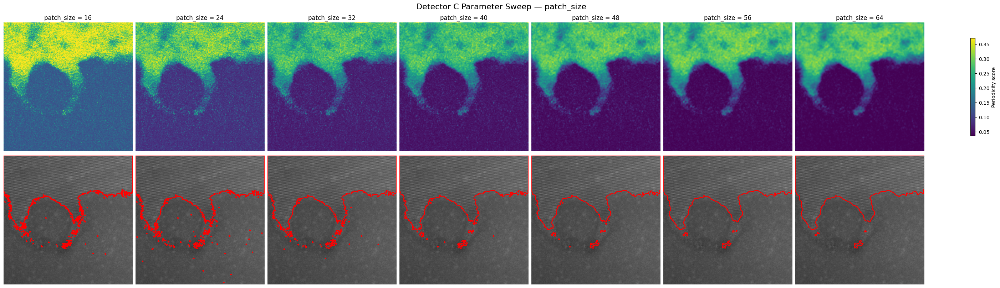

In [16]:
patch_sizes = [
    16,
    24,
    32,
    40,
    48,
    56,
    64,
]

patch_size_results = sweep_detector_c_parameter(
    image=image,
    parameter_name="patch_size",
    parameter_values=patch_sizes,
    baseline_parameters=baseline_parameters,
)

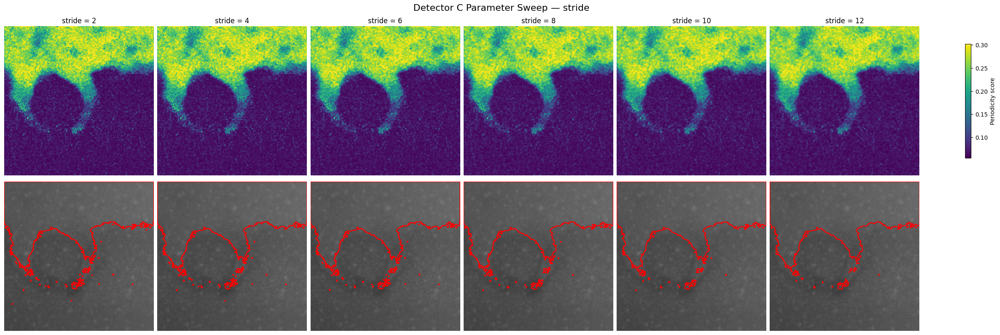

In [17]:
strides = [
    2,
    4,
    6,
    8,
    10,
    12,
]

stride_results = sweep_detector_c_parameter(
    image=image,
    parameter_name="stride",
    parameter_values=strides,
    baseline_parameters=baseline_parameters,
)

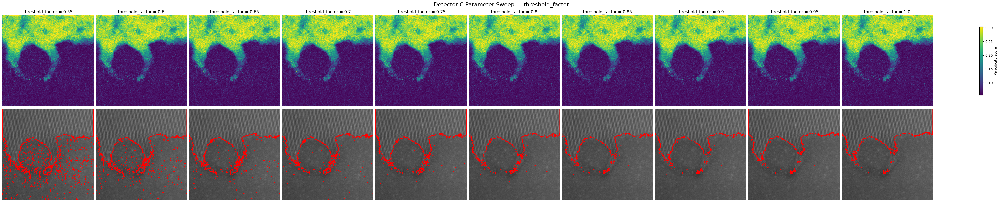

In [18]:
threshold_factors = [
    0.55,
    0.60,
    0.65,
    0.70,
    0.75,
    0.80,
    0.85,
    0.90,
    0.95,
    1.00,
]

threshold_results = sweep_detector_c_parameter(
    image=image,
    parameter_name="threshold_factor",
    parameter_values=threshold_factors,
    baseline_parameters=baseline_parameters,
)

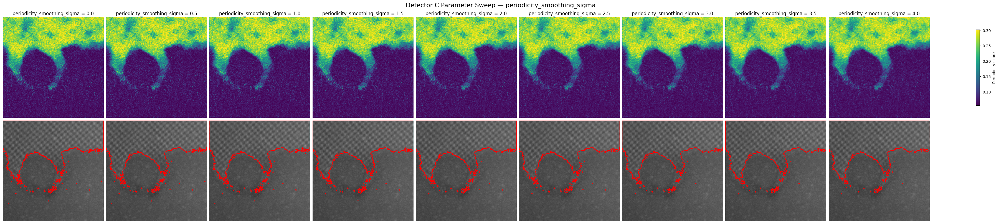

In [19]:
periodicity_smoothing_sigmas = [
    0.0,
    0.5,
    1.0,
    1.5,
    2.0,
    2.5,
    3.0,
    3.5,
    4.0,
]

smoothing_results = sweep_detector_c_parameter(
    image=image,
    parameter_name="periodicity_smoothing_sigma",
    parameter_values=periodicity_smoothing_sigmas,
    baseline_parameters=baseline_parameters,
)

## 4. Test one image visually

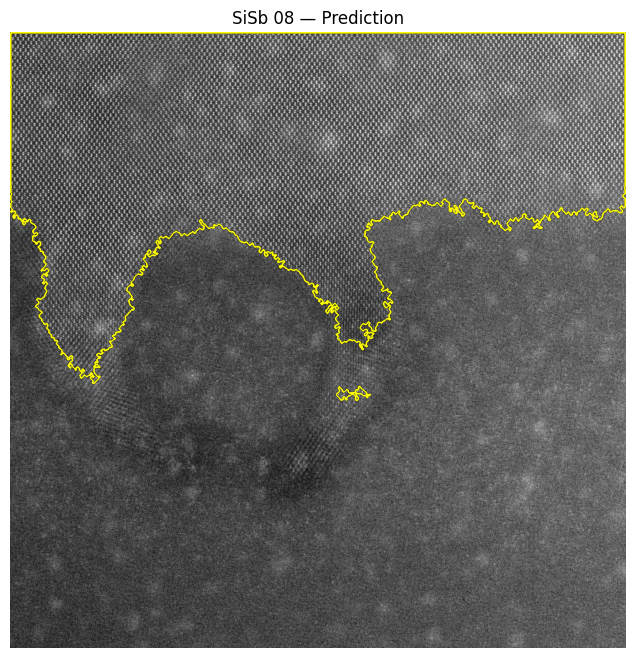

In [20]:
# gaussian approach example

example_index = 7

image = sisb_images[example_index]
boundary = detect_boundary(image)

plot_boundary_result(
    image,
    boundary,
    title=f"SiSb {sisb_titles[example_index]} — Prediction",
)

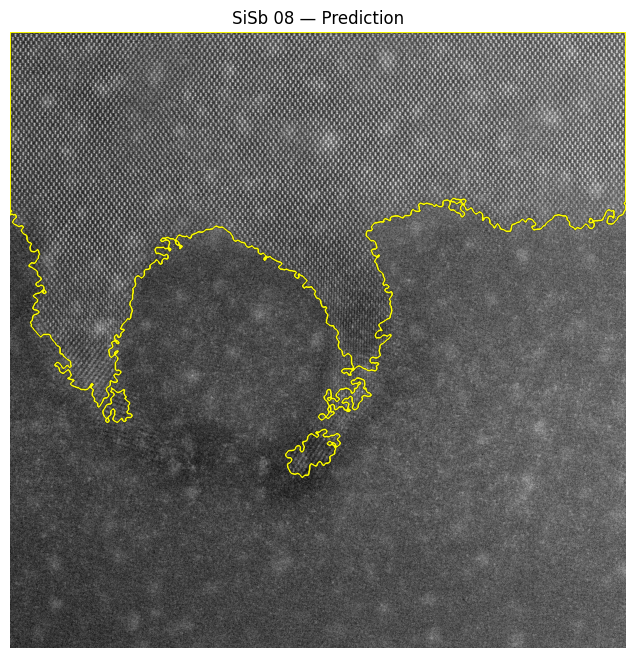

In [21]:
# FFT approach example

example_index = 7

image = sisb_images[example_index]
boundary = detect_boundary_C(image)

plot_boundary_result(
    image,
    boundary,
    title=f"SiSb {sisb_titles[example_index]} — Prediction",
)

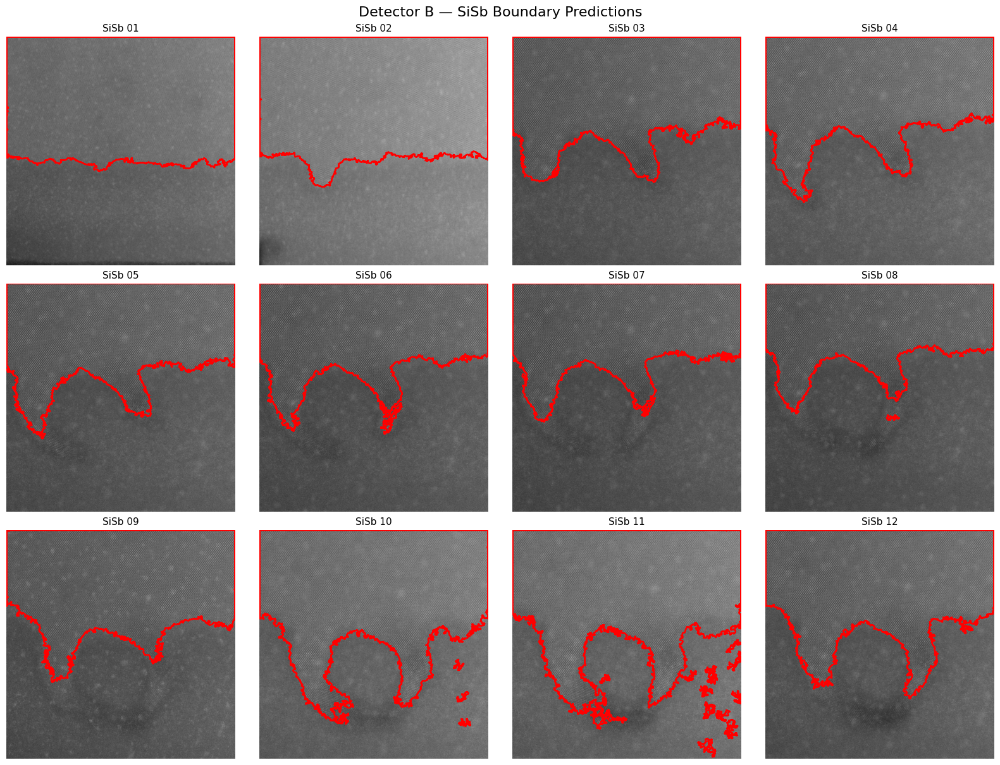

In [22]:
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# Run Detector B on all SiSb images
# ============================================================

n_images = len(sisb_images)

ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(4 * ncols, 4 * nrows),
    constrained_layout=True
)

axes = np.atleast_1d(axes).ravel()


for i, image in enumerate(sisb_images):

    # Detect boundary
    boundary = detect_boundary(image)

    # Plot STEM image
    axes[i].imshow(
        image,
        cmap="gray"
    )

    # Overlay detected boundary
    axes[i].contour(
        boundary,
        levels=[0.5],
        colors="red",
        linewidths=1.5
    )

    axes[i].set_title(
        f"SiSb {sisb_titles[i]}",
        fontsize=11
    )

    axes[i].axis("off")


# Hide unused subplot axes
for i in range(n_images, len(axes)):
    axes[i].axis("off")


plt.suptitle(
    "Detector B — SiSb Boundary Predictions",
    fontsize=16
)

plt.show()

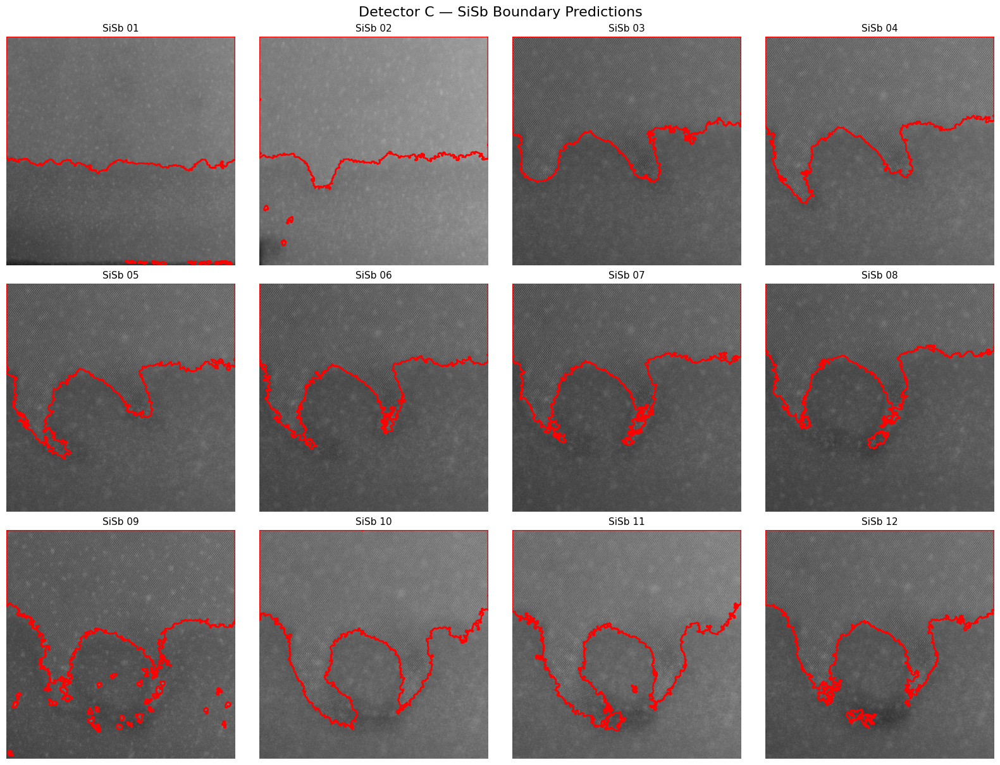

In [23]:
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# Run Detector C on all SiSb images
# ============================================================

n_images = len(sisb_images)

ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(4 * ncols, 4 * nrows),
    constrained_layout=True
)

axes = np.atleast_1d(axes).ravel()


for i, image in enumerate(sisb_images):

    # Detect boundary
    boundary = detect_boundary_C(image)

    # Plot STEM image
    axes[i].imshow(
        image,
        cmap="gray"
    )

    # Overlay detected boundary
    axes[i].contour(
        boundary,
        levels=[0.5],
        colors="red",
        linewidths=1.5
    )

    axes[i].set_title(
        f"SiSb {sisb_titles[i]}",
        fontsize=11
    )

    axes[i].axis("off")


# Hide unused subplot axes
for i in range(n_images, len(axes)):
    axes[i].axis("off")


plt.suptitle(
    "Detector C — SiSb Boundary Predictions",
    fontsize=16
)

plt.show()

## 5. Challenge 1 evaluation

We evaluate only three things:

### 1. Accuracy against human ground truth
Predictions are compared with the hand-drawn boundary using a spatial tolerance. Exact single-pixel agreement is not required.

Primary metric: **F1 @ 5 px tolerance**

### 2. Robustness
The same detector is tested after controlled perturbations:
- Gaussian noise
- Gaussian blur
- brightness change
- contrast change
- inclined intensity background

Every perturbed prediction is compared with the **same human ground truth**.

### 3. Speed
Only `detect_boundary(image)` is timed. File loading, plotting, and scoring are excluded.

### Test 1 — Accuracy against ground truth

In [24]:
accuracy_results = evaluate_against_ground_truth(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=50,
)

accuracy_results

,image,precision,recall,f1,mean_pred_to_gt_distance,mean_gt_to_pred_distance,mean_symmetric_boundary_error
0,01,0.432353,1.000000,0.603696,460.703041,19.751398,240.227219
1,02,0.423187,0.977809,0.590717,428.245338,23.433182,225.839260
2,03,0.337649,0.777047,0.470746,284.412370,34.785476,159.598923
3,04,0.217486,0.536977,0.309585,275.896681,50.094678,162.995679
4,05,0.229543,0.454653,0.305065,269.528008,87.918617,178.723313
5,06,0.157317,0.382419,0.222928,257.830041,93.805747,175.817894
6,07,0.111039,0.227538,0.149246,268.556803,130.101560,199.329181
7,08,0.138828,0.246732,0.177681,248.608520,123.155003,185.881761
8,09,0.174108,0.272112,0.212347,283.412346,170.725632,227.068989
9,10,0.500755,0.829690,0.624560,216.712059,36.746091,126.729075


In [25]:
summarize_accuracy(
    accuracy_results
)

mean_precision              0.298642
mean_recall                 0.601950
mean_f1                     0.395605
mean_boundary_error_px    180.725968
Name: Clean boundary accuracy, dtype: float64

In [26]:
accuracy_results_C = evaluate_against_ground_truth(
    detect_boundary_C,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=50,
)

accuracy_results

,image,precision,recall,f1,mean_pred_to_gt_distance,mean_gt_to_pred_distance,mean_symmetric_boundary_error
0,01,0.432353,1.000000,0.603696,460.703041,19.751398,240.227219
1,02,0.423187,0.977809,0.590717,428.245338,23.433182,225.839260
2,03,0.337649,0.777047,0.470746,284.412370,34.785476,159.598923
3,04,0.217486,0.536977,0.309585,275.896681,50.094678,162.995679
4,05,0.229543,0.454653,0.305065,269.528008,87.918617,178.723313
5,06,0.157317,0.382419,0.222928,257.830041,93.805747,175.817894
6,07,0.111039,0.227538,0.149246,268.556803,130.101560,199.329181
7,08,0.138828,0.246732,0.177681,248.608520,123.155003,185.881761
8,09,0.174108,0.272112,0.212347,283.412346,170.725632,227.068989
9,10,0.500755,0.829690,0.624560,216.712059,36.746091,126.729075


In [27]:
summarize_accuracy(
    accuracy_results_C
)

mean_precision              0.323038
mean_recall                 0.716557
mean_f1                     0.442564
mean_boundary_error_px    170.594876
Name: Clean boundary accuracy, dtype: float64

### Test 2 — Robustness

In [28]:
robustness_results = evaluate_robustness(
    detect_boundary,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=5,
    max_images=4,
)

robustness_summary = summarize_robustness(
    robustness_results
)

robustness_summary

,condition,mean_f1,std_f1,mean_precision,mean_recall,mean_boundary_error_px,f1_drop_from_clean
0,Clean,0.009456,0.009555,0.006867,0.015735,186.444273,0.000000
1,Gaussian noise 5%,0.015401,0.016897,0.010846,0.027123,181.718206,-0.005944
2,Gaussian blur sigma=1,0.011124,0.013611,0.008038,0.018769,195.411521,-0.001668
3,Brightness +10%,0.009456,0.009555,0.006867,0.015735,186.444273,0.000000
4,Contrast -20%,0.009456,0.009555,0.006867,0.015735,186.444273,0.000000
5,Intensity gradient 20%,0.008662,0.010201,0.006255,0.014510,187.875633,0.000795


In [29]:
robustness_results_C = evaluate_robustness(
    detect_boundary_C,
    sisb_images,
    sisb_files,
    sisb_titles,
    GT_DIR,
    tolerance_px=5,
    max_images=4,
)

robustness_summary_C = summarize_robustness(
    robustness_results_C
)   


robustness_summary_C

,condition,mean_f1,std_f1,mean_precision,mean_recall,mean_boundary_error_px,f1_drop_from_clean
0,Clean,0.037325,0.051790,0.024939,0.076578,184.089793,0.000000
1,Gaussian noise 5%,0.027175,0.036329,0.018379,0.053428,182.884773,0.010150
2,Gaussian blur sigma=1,0.002904,0.001128,0.002353,0.004616,528.085455,0.034421
3,Brightness +10%,0.037325,0.051790,0.024939,0.076578,184.089793,0.000000
4,Contrast -20%,0.037325,0.051790,0.024939,0.076578,184.089793,0.000000
5,Intensity gradient 20%,0.037948,0.051200,0.025503,0.077011,184.227470,-0.000623


Interpretation:

- `mean_f1`: accuracy under that condition
- `mean_boundary_error_px`: average symmetric distance to the human boundary
- `f1_drop_from_clean`: performance lost relative to the clean images

**Smaller F1 drop is better.**

### Test 3 — Speed

In [30]:
speed_results = evaluate_speed(
    detect_boundary,
    sisb_images,
    repeats=5,
)

summarize_speed(
    speed_results
)

mean_seconds_per_image      0.824863
median_seconds_per_image    0.824823
slowest_seconds             0.859118
images_per_second           1.212322
Name: Speed, dtype: float64

In [31]:
speed_results_C = evaluate_speed(
    detect_boundary_C,
    sisb_images,
    repeats=5,
)

summarize_speed(
    speed_results_C
)

mean_seconds_per_image      6.897878
median_seconds_per_image    6.850773
slowest_seconds             7.665515
images_per_second           0.144972
Name: Speed, dtype: float64

In [ ]:
# End of challenge 1

# Challenge 2 — Atom Finding in YBCO

## Goal

Write:

```python
positions = find_atoms(image)
```

The function must return a NumPy array of shape `(N, 2)`.

Each row is:

```text
[y, x]
```

in pixel coordinates.

## 6. Load YBCO

In [ ]:
ybco_files = list_emd_files(YBCO_DIR)

ybco_images = [
    load_haadf(file)
    for file in ybco_files
]

ybco_titles = [
    file.stem
    for file in ybco_files
]

print(f"Found {len(ybco_images)} YBCO images")

if ybco_images:
    show_image_grid(
        ybco_images,
        titles=[
            str(i + 1)
            for i in range(len(ybco_images))
        ],
        rows=1 if len(ybco_images) > 1 else 1,
    )

## 7. Build your atom finder

A simple local-maximum baseline is provided.

You may completely replace the code between the two markers.

In [ ]:
def find_atoms(image):

    # ============================================================
    # ===== YOUR CODE START — CHANGE CODE BELOW THIS LINE =====
    # ============================================================

    # 1. Normalize
    x = robust_normalize(image)

    # 2. Smooth
    smooth = ndimage.gaussian_filter(
        x,
        sigma=1.0
    )

    # 3. Find local maxima
    neighborhood = 5

    local_max = (
        smooth
        == ndimage.maximum_filter(
            smooth,
            size=neighborhood,
            mode="reflect",
        )
    )

    # 4. Keep only bright maxima
    intensity_threshold = np.percentile(
        smooth,
        97.0,
    )

    peaks = (
        local_max
        & (smooth >= intensity_threshold)
    )

    # 5. Convert peaks to [y, x]
    positions = np.argwhere(peaks)

    # ============================================================
    # ===== YOUR CODE END — DO NOT CHANGE CODE BELOW HERE =====
    # ============================================================

    return np.asarray(
        positions
    ).reshape(-1, 2).astype(float)

## 8. Test one YBCO image visually

In [ ]:
if ybco_images:

    atom_example_index = 0

    atom_positions = find_atoms(
        ybco_images[atom_example_index]
    )

    validate_atom_output(
        ybco_images[atom_example_index],
        atom_positions,
    )

    plot_atom_result(
        ybco_images[atom_example_index],
        atom_positions,
        title="YBCO atom finding",
    )

## 9. Challenge 2 engineering tests

Until atom ground truth is added, these measure **consistency and robustness**, not true atom-detection accuracy.

In [ ]:
if ybco_images:
    atom_noise_results = atom_noise_robustness(
        find_atoms,
        ybco_images,
        noise_levels=(0.01, 0.03, 0.05, 0.10),
        tolerance=2.0,
    )

atom_noise_results

In [ ]:
if ybco_images:
    atom_photometric_results = atom_photometric_robustness(
        find_atoms,
        ybco_images,
        tolerance=2.0,
    )

atom_photometric_results

In [ ]:
if ybco_images:

    atom_speed_results = evaluate_speed(
        find_atoms,
        ybco_images,
        repeats=5,
    )

summarize_speed(
        atom_speed_results
    )

# 10. Reflection

At the end of the session, be ready to explain:

1. What approach did you use?
2. Which parameters matter most?
3. Where does it fail?
4. What would you improve next?
5. If AI helped write code, what did it generate?
6. What did you personally change?

> A good scientific algorithm is not just one that gives a nice picture.  
> You should be able to explain **how accurate, robust, and fast it is**.